[IPython Notebook](animation_basics.ipynb) |  [Python Script](animation_basics.py)

Advanced: Animations
============================

**NOTE:** this example script may take a while to load in a browser as there are many embedded animations.

Setup
-----------------------------

As always, let's do imports and initialize a logger and a new Bundle.  See [Building a System](../tutorials/building_a_system.html) for more details.

In [1]:
import phoebe
from phoebe import u # units
import numpy as np
import matplotlib.pyplot as plt

logger = phoebe.logger(clevel='INFO')

b = phoebe.default_binary()

/usr/local/lib/python2.7/dist-packages/IPython/kernel/__init__.py:13: ShimWarning: The `IPython.kernel` package has been deprecated. You should import from ipykernel or jupyter_client instead.
  "You should import from ipykernel or jupyter_client instead.", ShimWarning)


/usr/local/lib/python2.7/dist-packages/astropy/units/quantity.py:732: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  return super(Quantity, self).__eq__(other)


In [2]:
times = np.linspace(0,10,51)

In [3]:
b.add_dataset('lc', times=times, dataset='lc01')

<ParameterSet: 11 parameters | kinds: LC, LC_dep>

In [4]:
b.add_dataset('orb', times=times, dataset='orb01')

<ParameterSet: 2 parameters | components: primary, secondary>

In [5]:
b.run_compute(irrad_method='none', pbmesh=True)

<ParameterSet: 3690 parameters | kinds: mesh, orb, lc>

Showing and Saving
-----------------------

**NOTE:** in IPython notebooks calling animate will display directly below the call to animate (by exporting to html).  If you have [JSAnimation](https://github.com/jakevdp/JSAnimation) installed, you'll see a display with sliders, if not you'll see an embedded mp4 file.  When not in IPython you have several options for viewing the animation:

- call plt.show() after calling animate
- call the save method on the returned mpl anim object
- pass show=True to the animate method (same as calling plt.show())
- pass save='myfilename.gif' to the animate method (same as calling anim.save('myfilename.gif'))

Default Animations
-------------------------

By calling b.animate(), a subplot will be created for each dataset/method and will loop over each of the synthetic times.

To create a similar animation in real-time while creating the model, pass True to the animation keyword: 
- b.run_compute(animation=True).  

Note that whenever animating directly from run_compute some features aren't available, including the ability to save the animation.


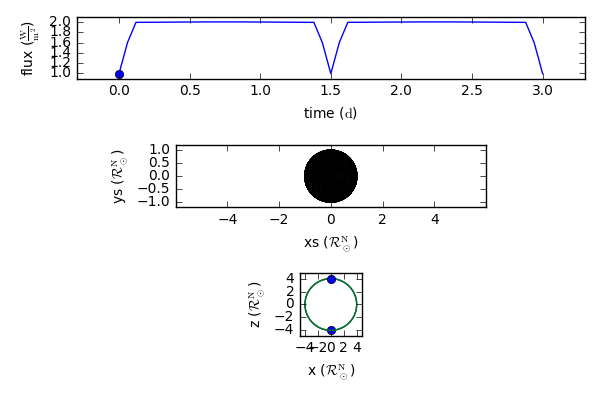
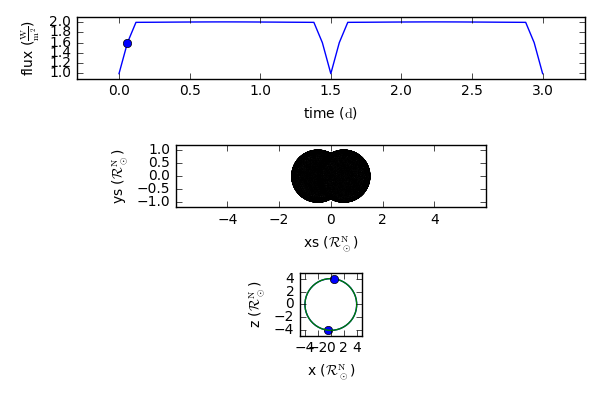
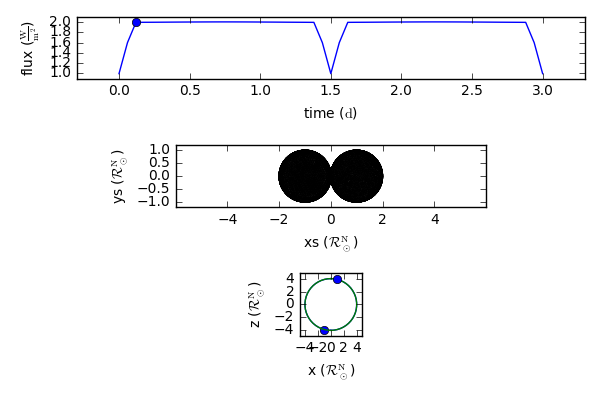
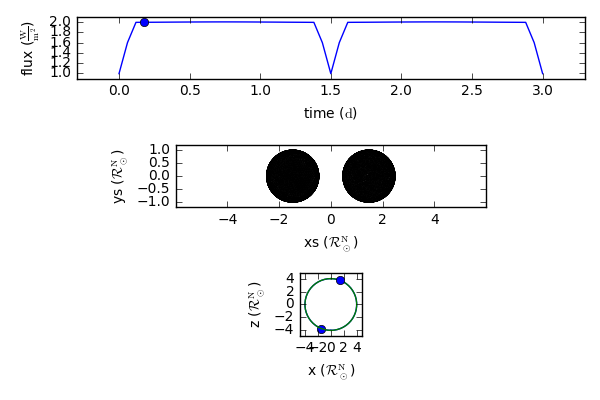
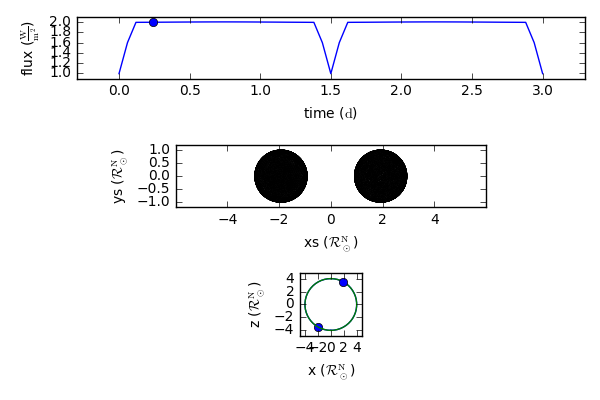
...
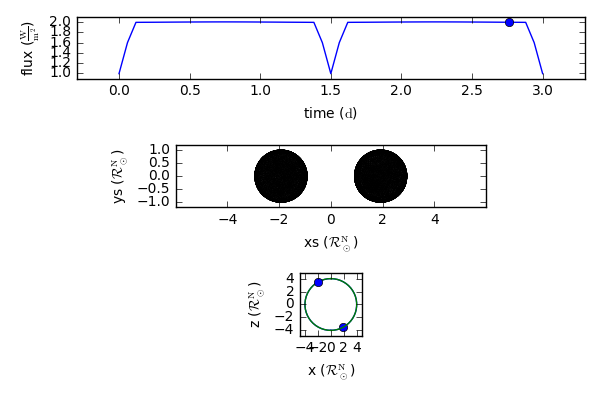
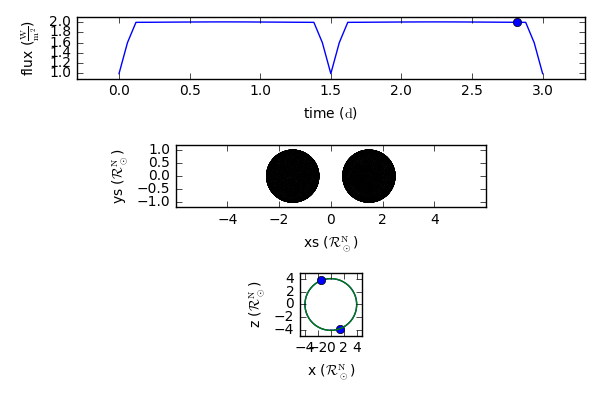
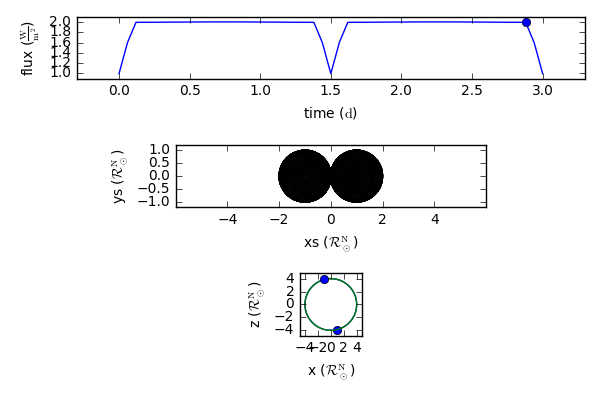
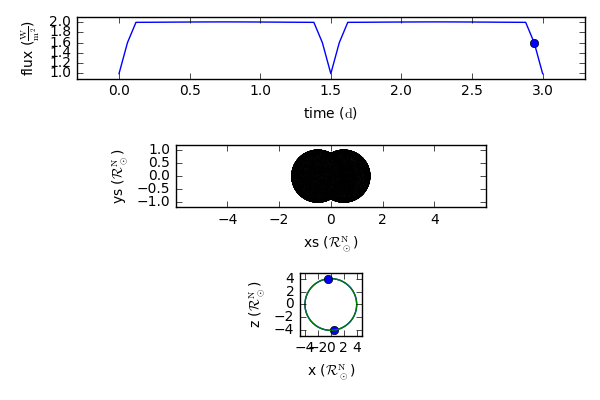
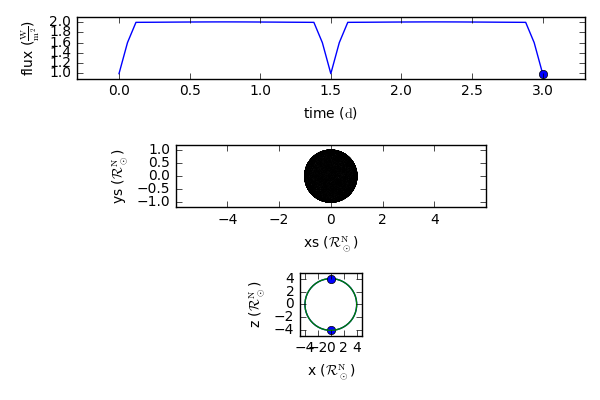

In [6]:
b.animate()

Note that like the rest of the examples below, this is simply the animated version of the exact same call to plot

Providing Times
-------------------

To override the default times explained above, pass a list or array to the times keyword.  For synthetic models, highlight mode will be enabled by default and the provided time does not need to be one that is computed - the value will be interpolated if it is not.  However, for plotting meshes, the exact time must be stored in the synthetic meshes or they will not be drawn.

This is especially usefully in cases where you may not want to repeat the first and last frame for a looping gif, or where you want a smoother animation by interpolation.  In this example we'll plot all but the last time so that the loop doesn't have a repeated frame.

In this example, times[:-1:2] means skip the last time and only use every-other time.

This option is not available from run_compute - a frame will be drawn for each computed time.


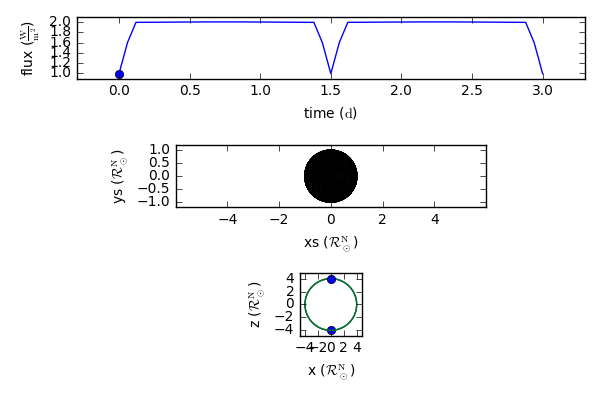
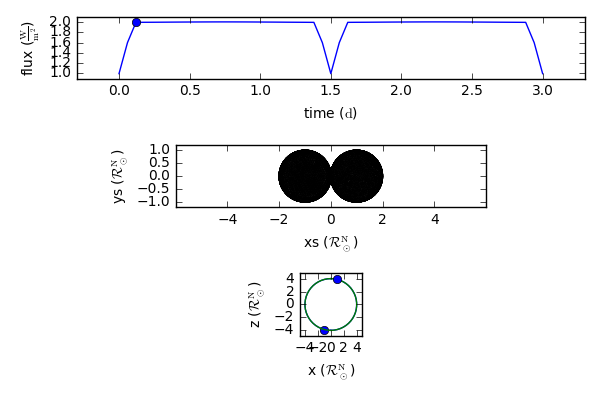
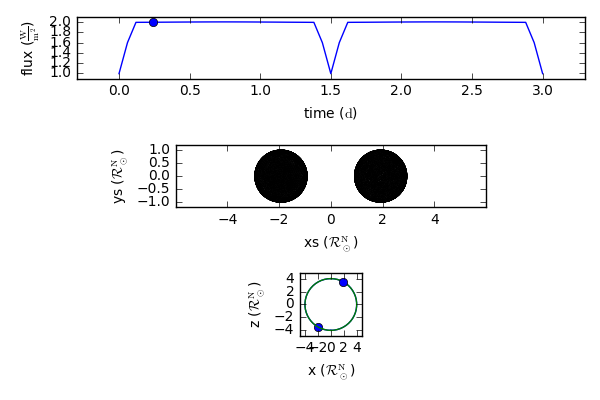
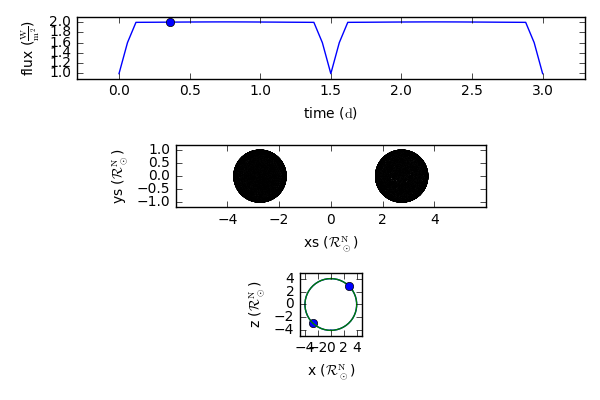
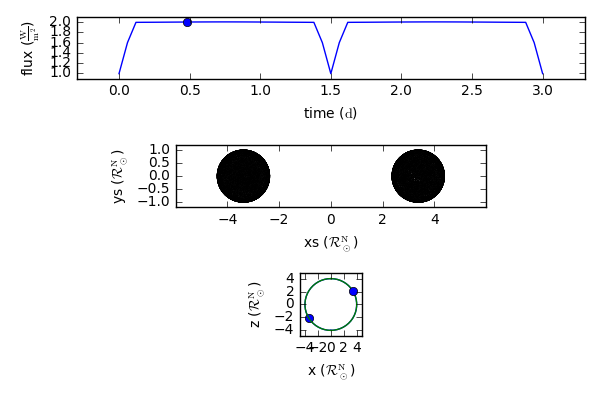
...
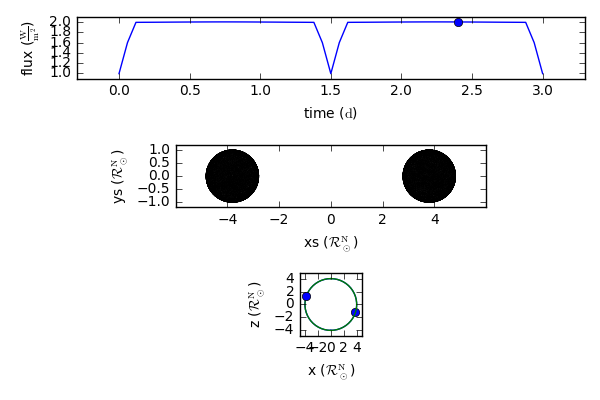
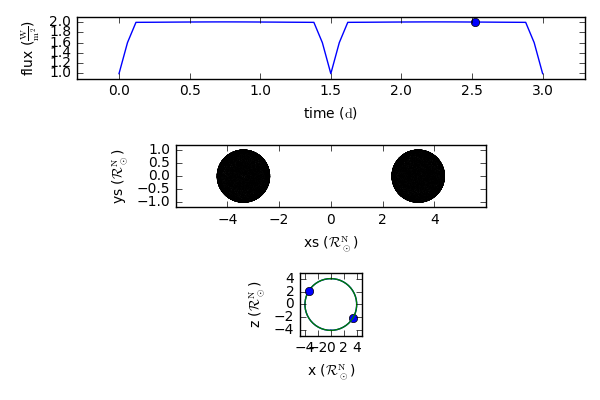
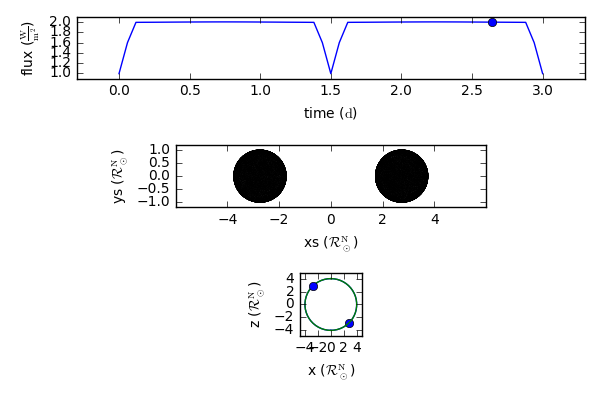
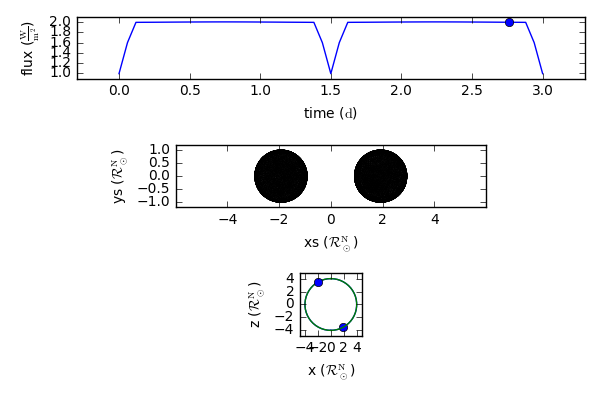
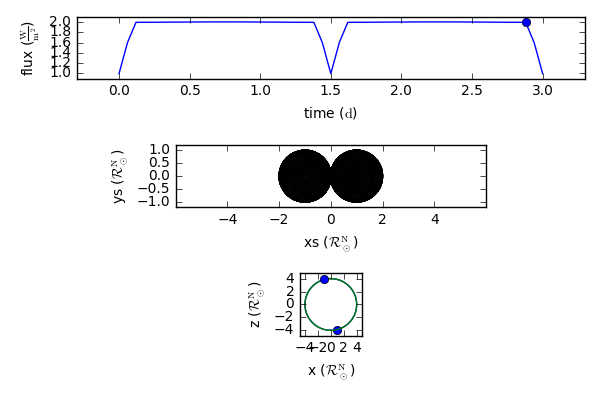

In [7]:
plt.clf()  # this is necessary since the current axes still has the last frame of the previous animation
b.animate(times=times[:-1:2])

Selecting Datasets
----------------------

To override the default datasets, provide valid twigs or a list of valid twigs as positional arguments.

To choose datasets while animating from run_compute, pass the single twig or list/tuple of twigs to the animate keyword:
- b.run_compute(animate=('lc01', 'rv01'))


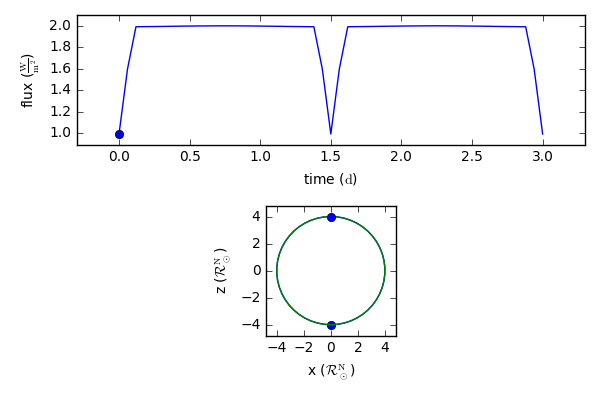
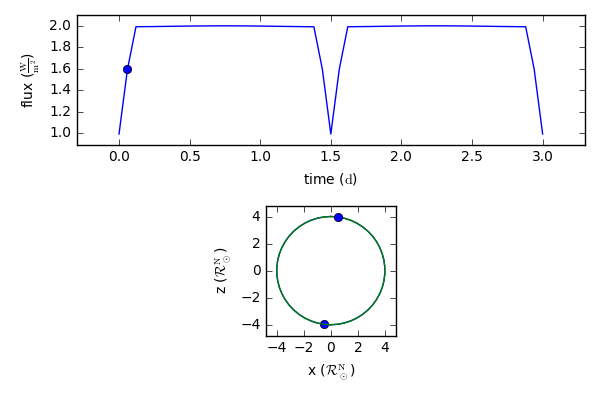
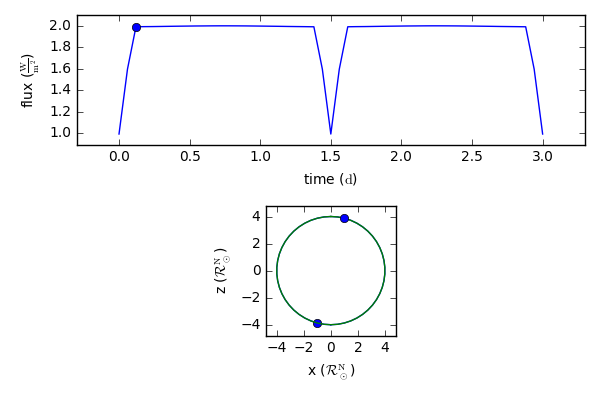
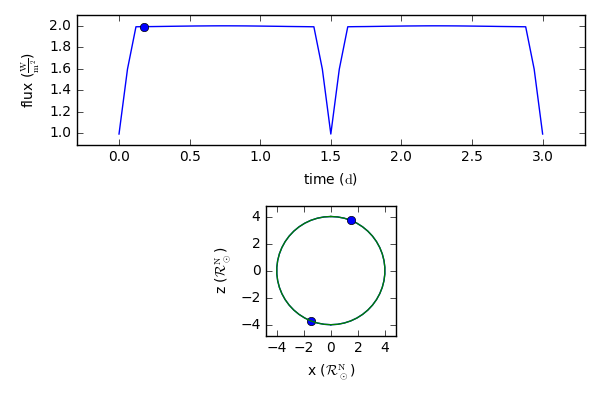
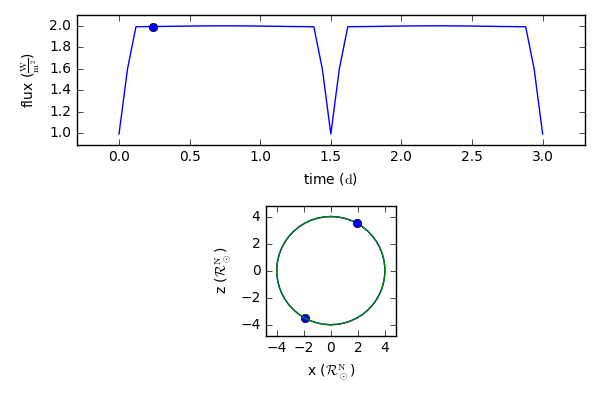
...
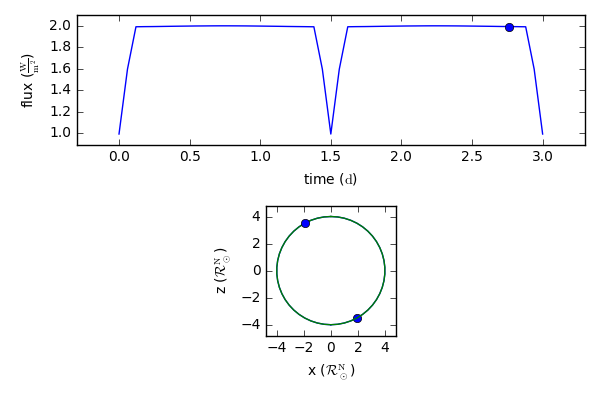
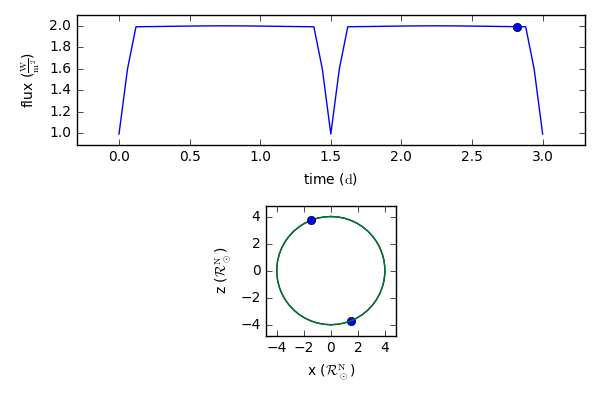
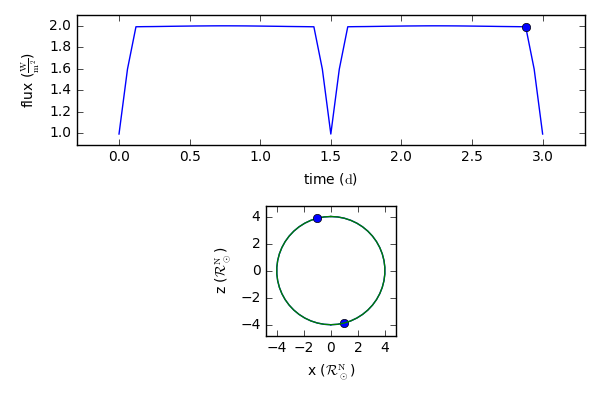
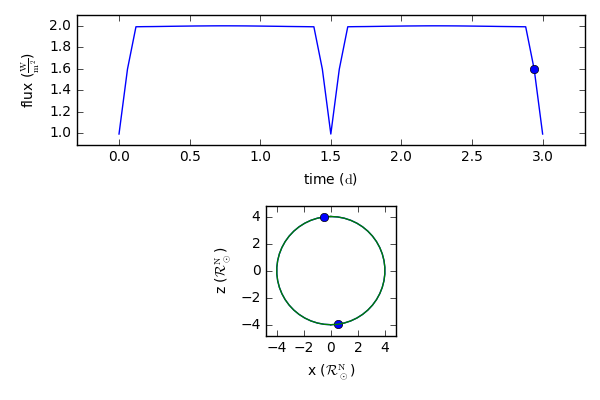
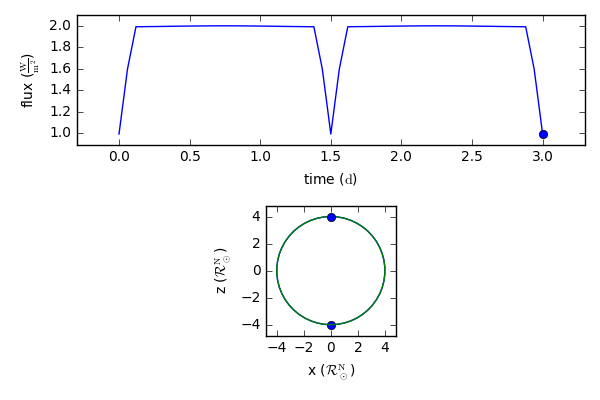

In [8]:
plt.clf()  # this is necessary since the current axes still has the last frame of the previous animation
b.animate('lc01', 'orb01')
# identical to the following:
# b.animate(('lc01', 'orb01'))

Note that to animate a single dataset, you can either provide a single string pointing to that dataset or you can run animate on a filtered ParameterSet that only includes that dataset.


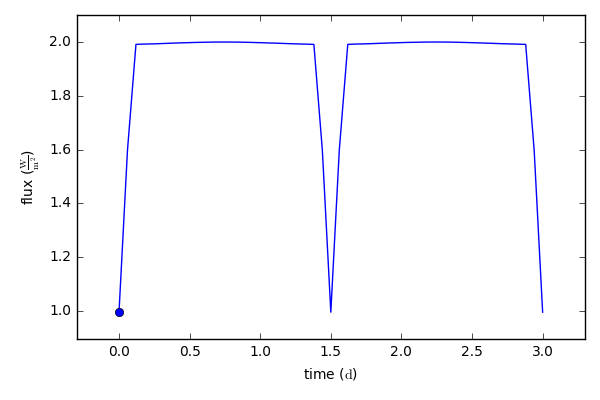
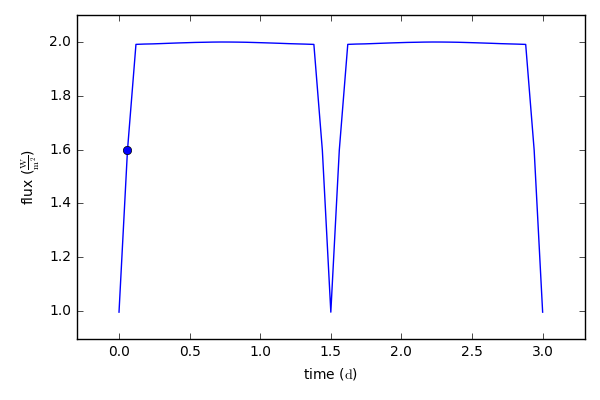
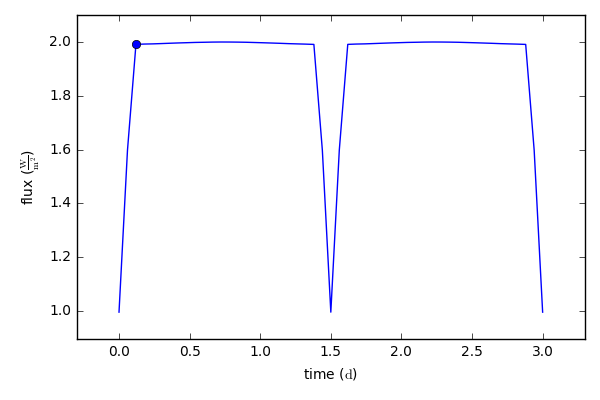
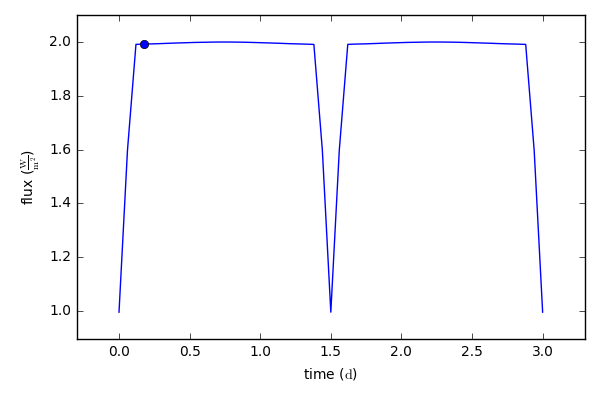
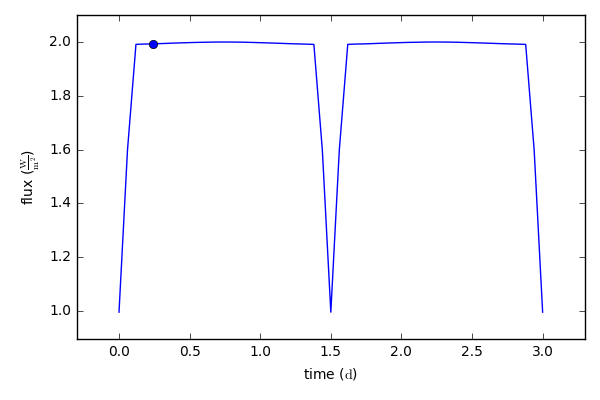
...
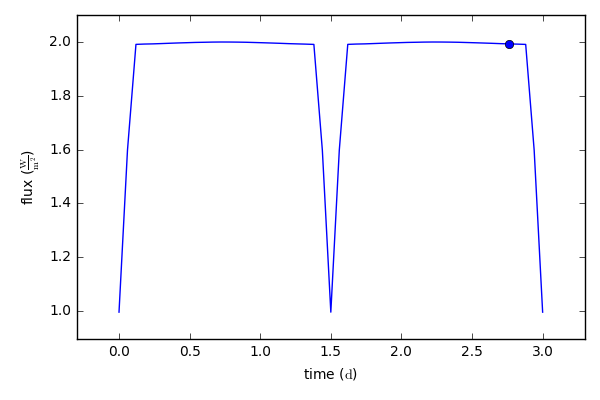
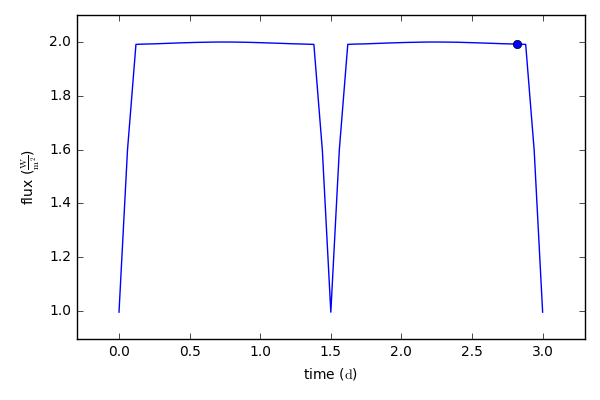
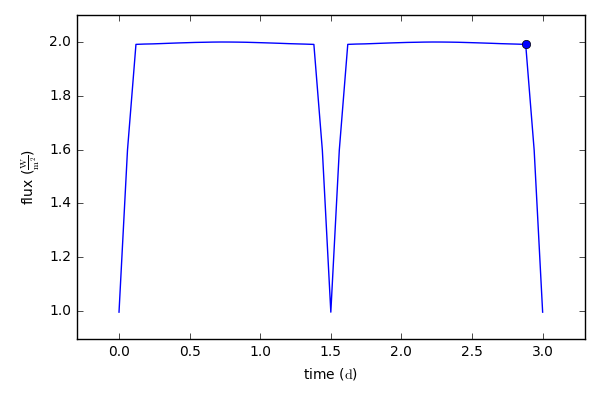
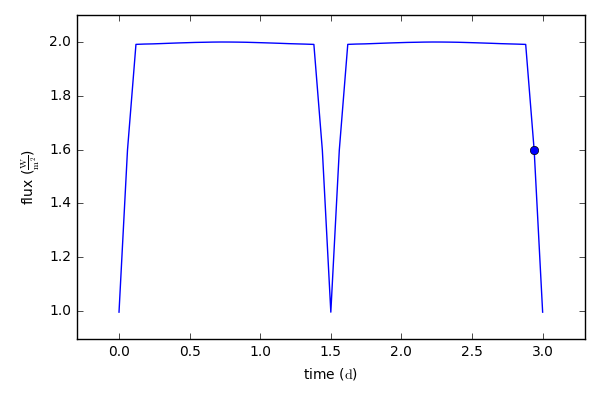
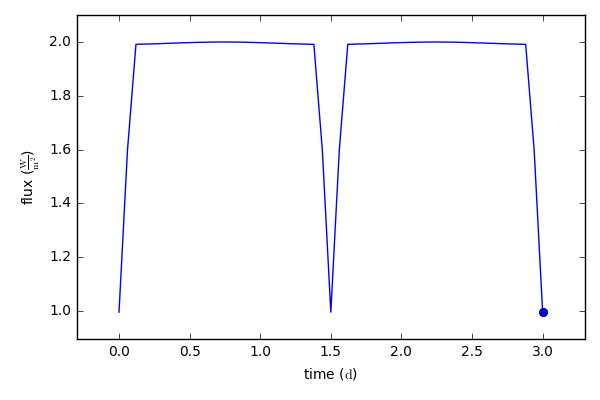

In [9]:
plt.clf()  # this is necessary since the current axes still has the last frame of the previous animation
b['lc01@model'].animate()
# identical to the following:
# b.animate('lc01@model')
# b.filter(dataset='lc01', context='model').animate()

Plotting Options
----------------------

By default, time highlighting is turned on.  See the [plotting tutorial](plotting) for details on 'highlight' and 'uncover' options.

Any additional arguments (facecolor, linestyle, etc) are passed to the plot call for EACH frame and for EVERY plotting call.


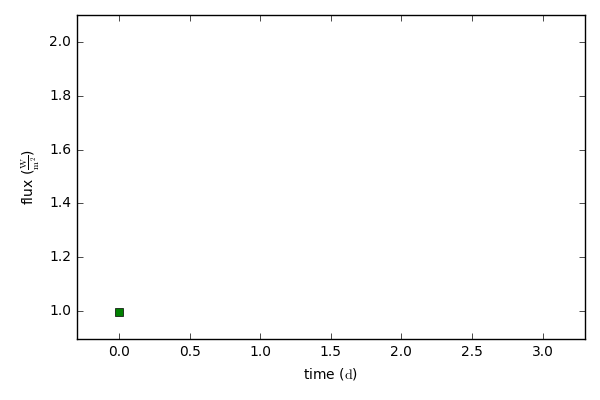
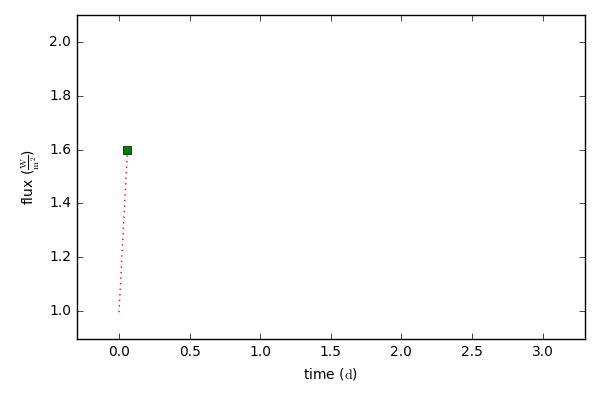
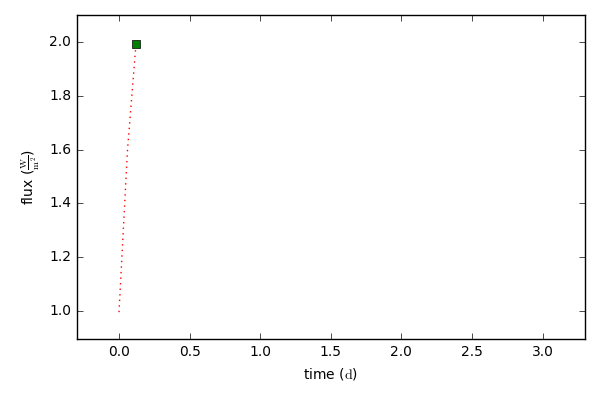
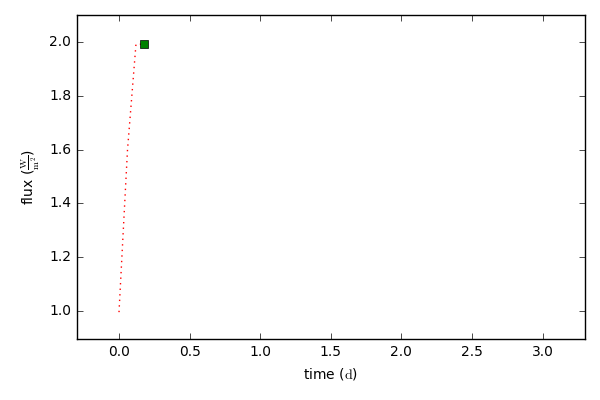
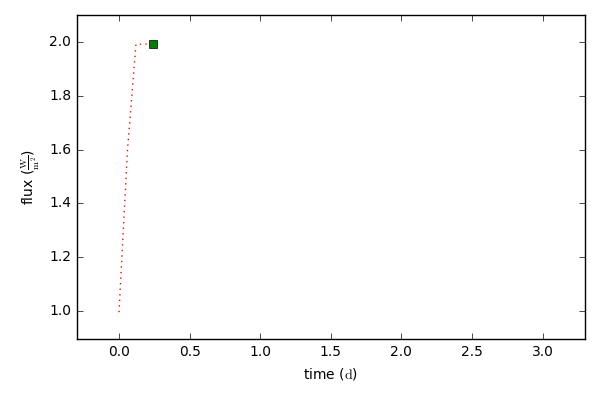
...
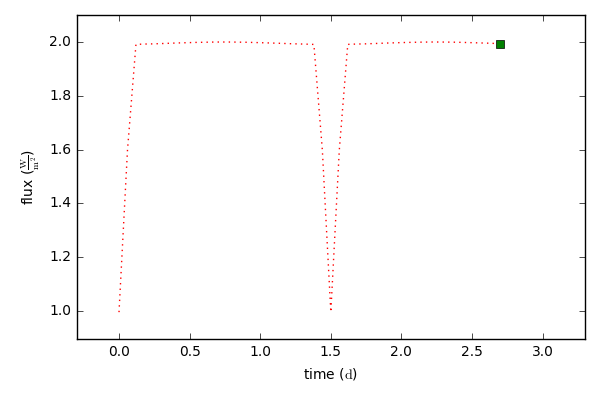
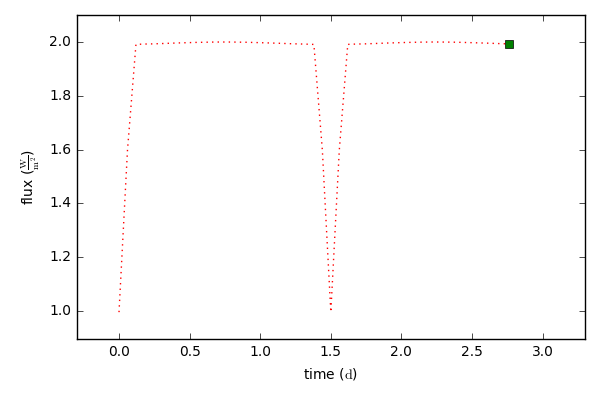
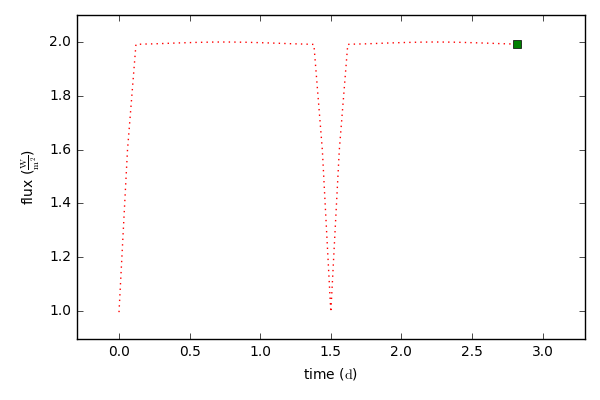
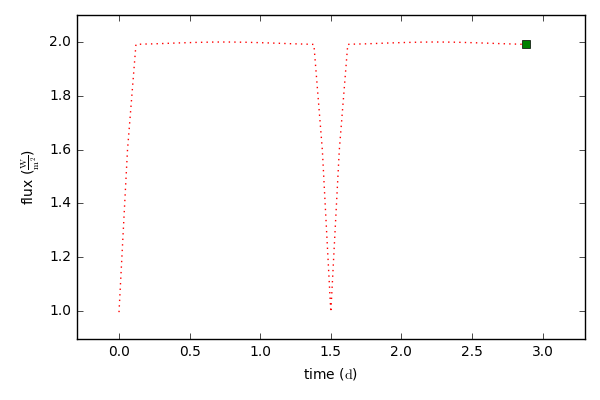
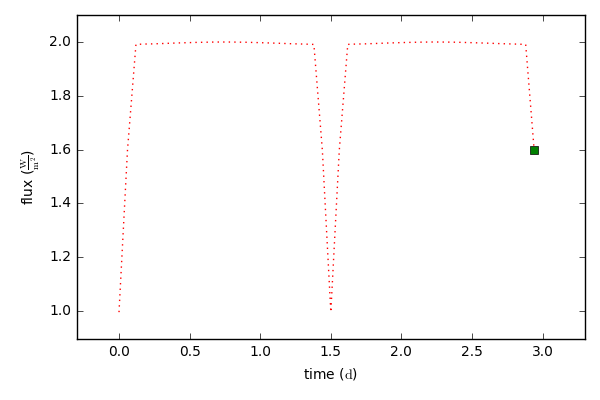

In [10]:
plt.clf()  # this is necessary since the current axes still has the last frame of the previous animation
b['lc01@model'].animate(times=times[:-1], uncover=True,\
                        color='r', linestyle=':',\
                        highlight_marker='s', highlight_color='g')

/home/kyle/.local/lib/python2.7/site-packages/phoebe/frontend/plotting.py:242: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if pckwargs['edgecolors'] in ['none', 'None', None] and pckwargs['facecolors'] not in ['none', 'None', None]:
/home/kyle/.local/lib/python2.7/site-packages/phoebe/frontend/plotting.py:242: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  if pckwargs['edgecolors'] in ['none', 'None', None] and pckwargs['facecolors'] not in ['none', 'None', None]:



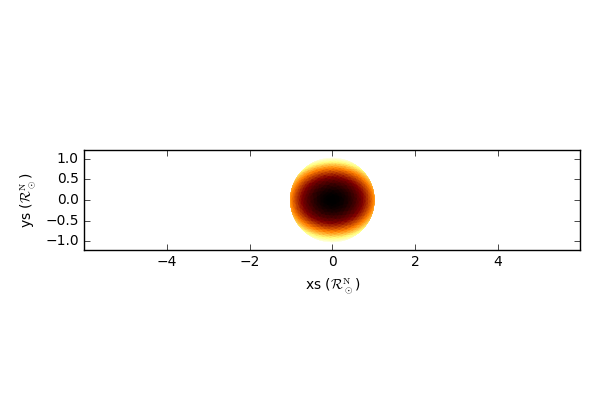
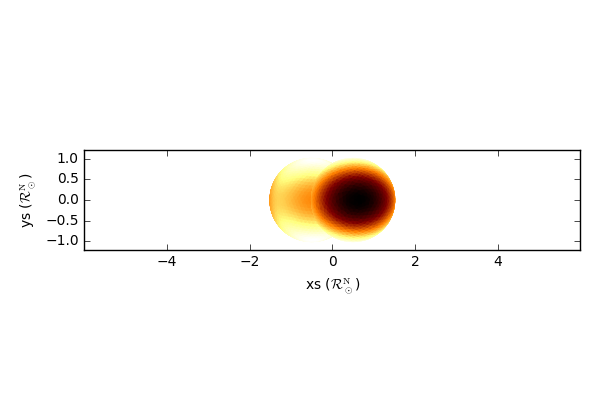
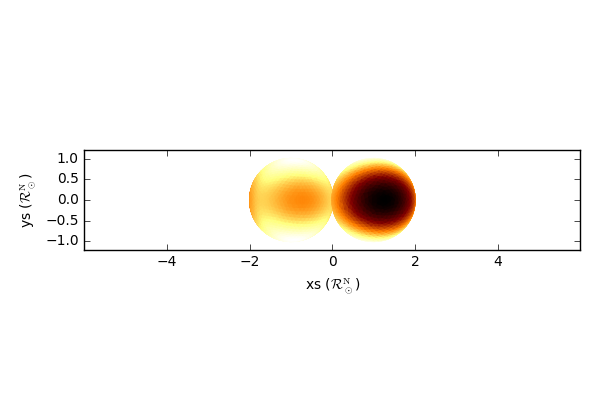
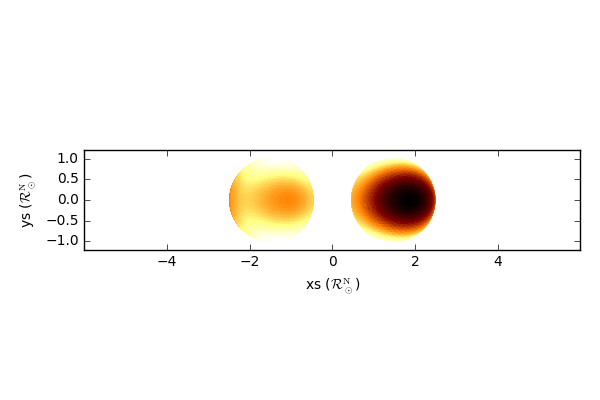
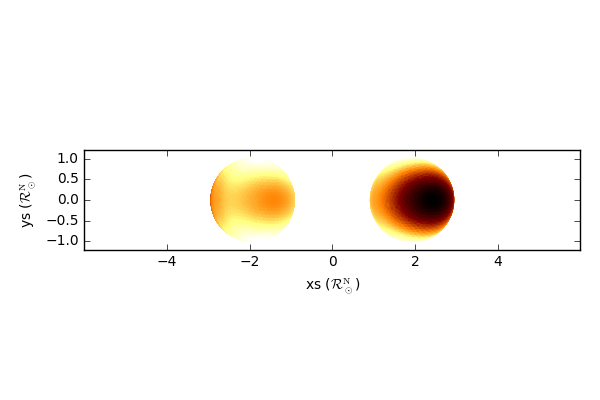
...
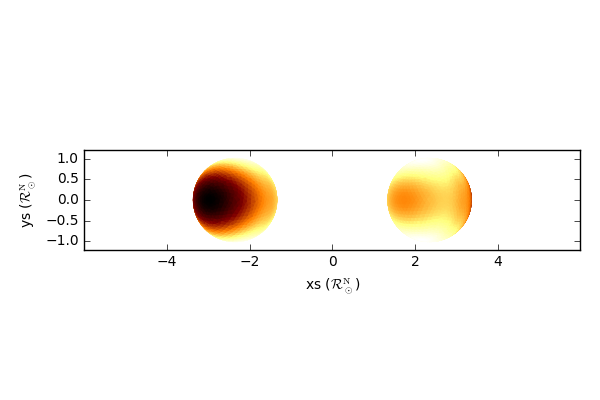
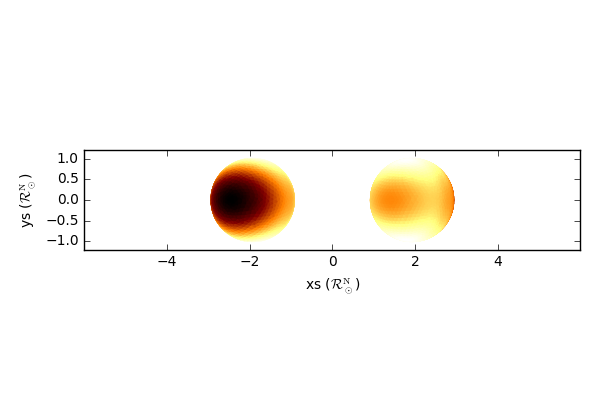
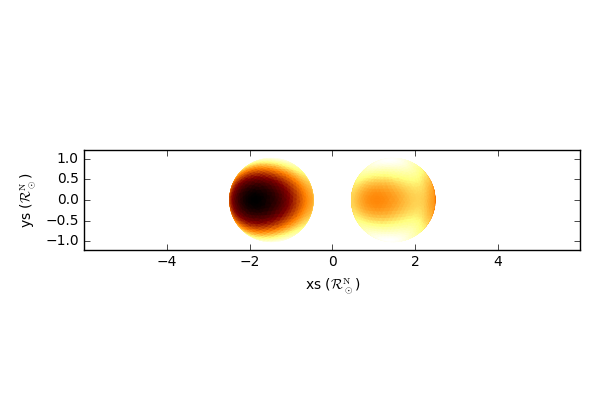
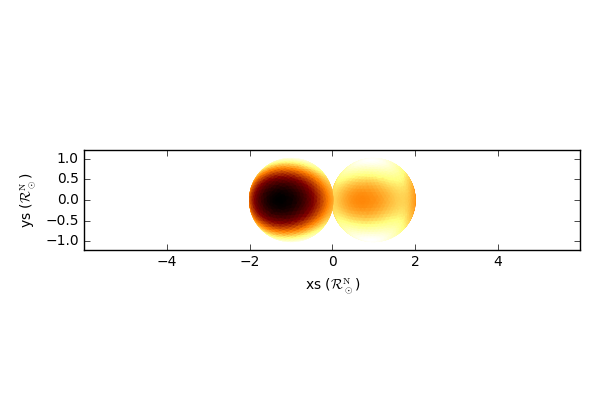
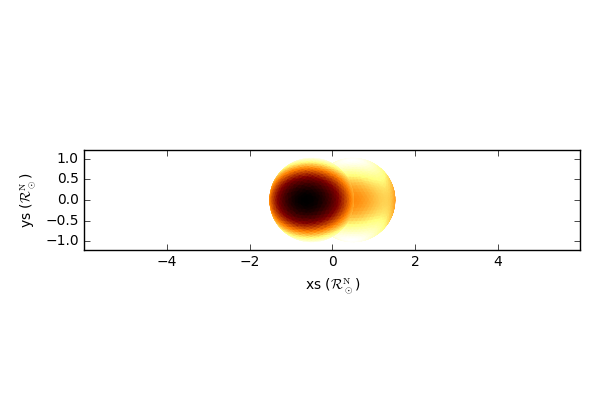

In [13]:
plt.clf()  # this is necessary since the current axes still has the last frame of the previous animation
b['pbmesh@model'].animate(times=times[:-1], facecolor='teffs', edgecolor=None)

To provide plotting options to a SINGLE plotting call, you must pass them inside a dictionary to the positional arguments.  Notice the difference between the following two animations.

/usr/local/lib/python2.7/dist-packages/matplotlib/axis.py:1017: UserWarning: Unable to find pixel distance along axis for interval padding of ticks; assuming no interval padding needed.
  warnings.warn("Unable to find pixel distance along axis "
/usr/local/lib/python2.7/dist-packages/matplotlib/axis.py:1027: UserWarning: Unable to find pixel distance along axis for interval padding of ticks; assuming no interval padding needed.
  warnings.warn("Unable to find pixel distance along axis "



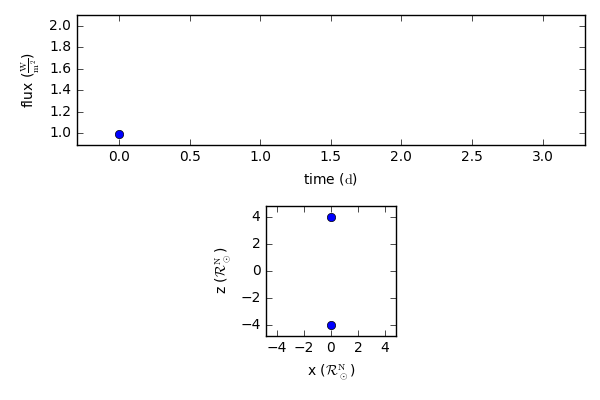
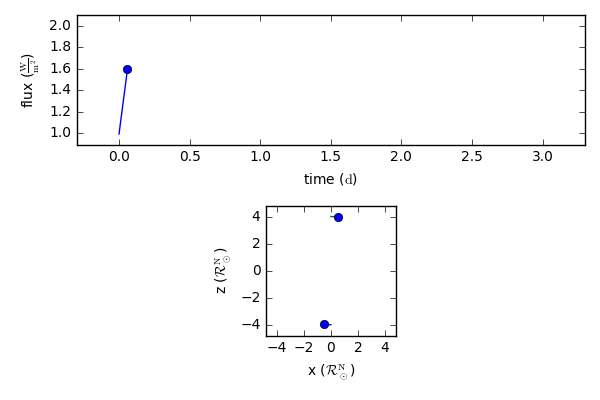
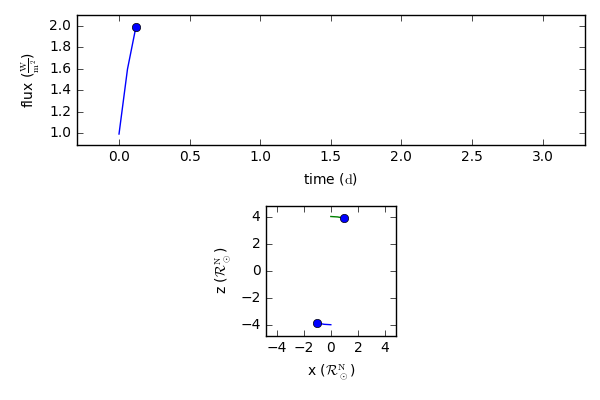
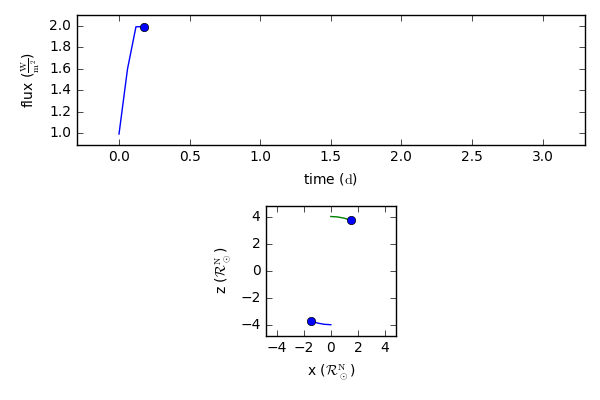
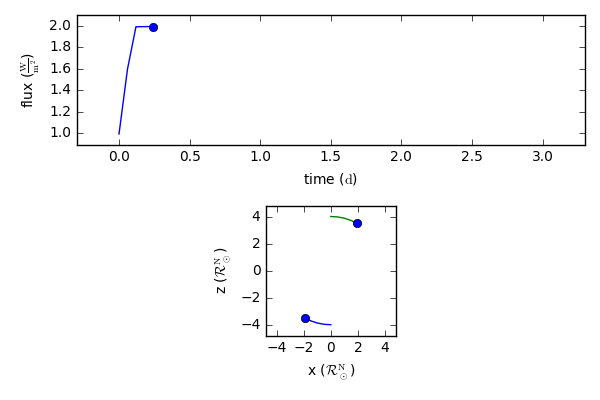
...
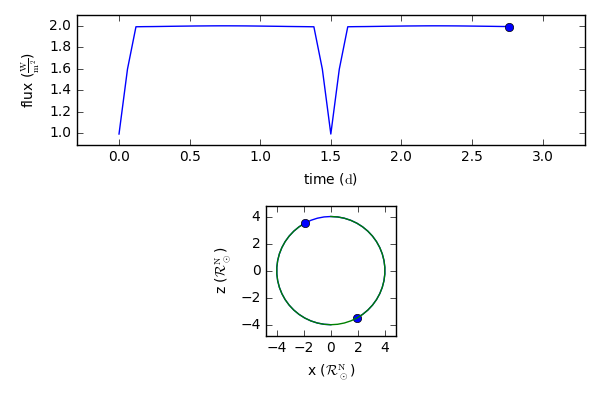
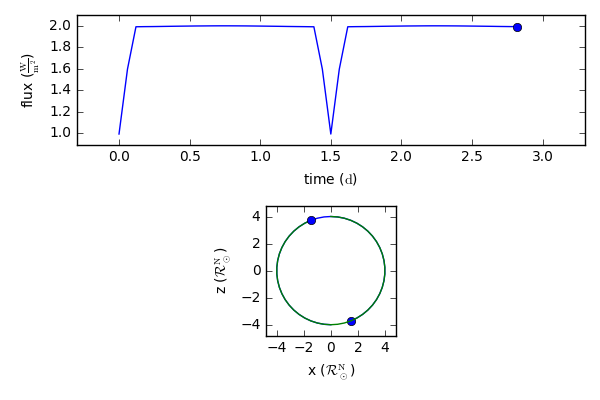
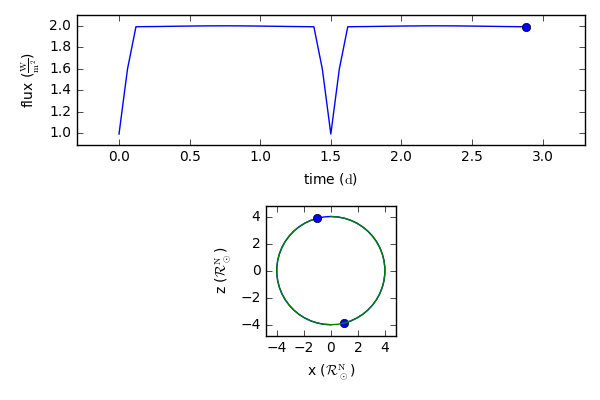
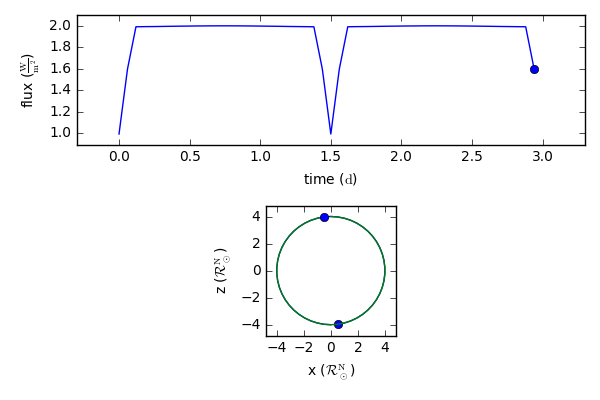
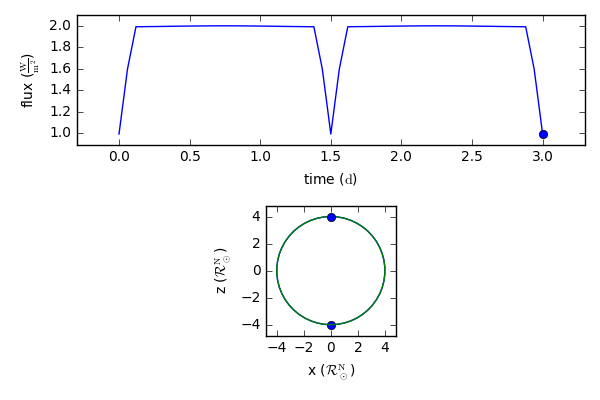

In [14]:
plt.clf()  # this is necessary since the current axes still has the last frame of the previous animation
b.animate('lc01', 'orb01', uncover=True)


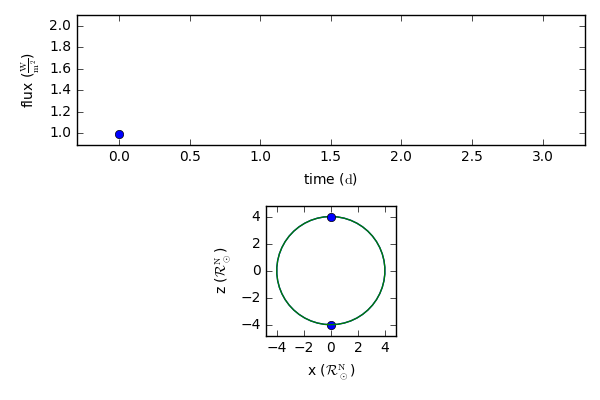
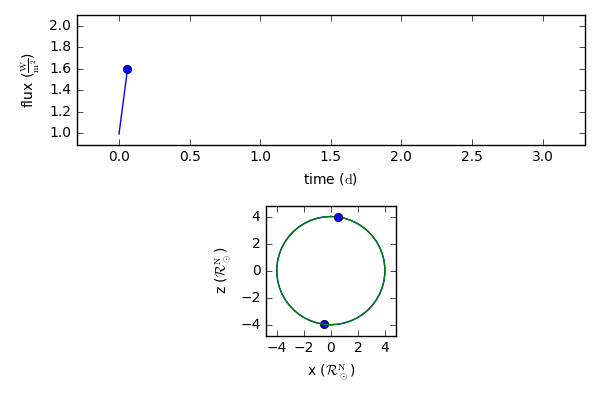
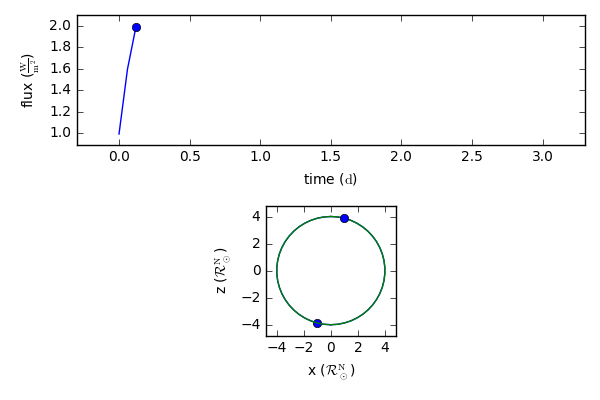
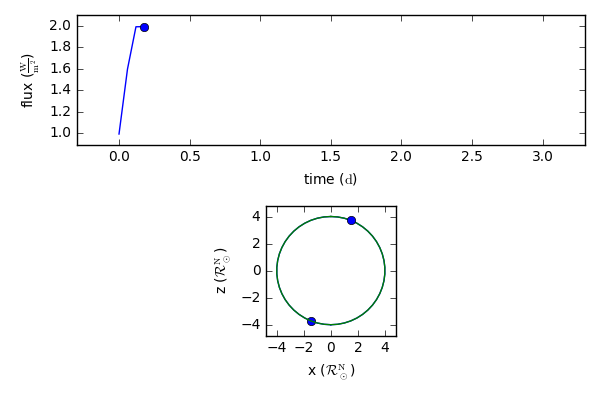
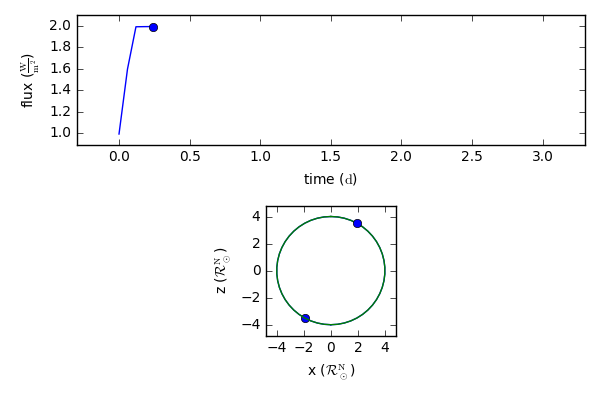
...
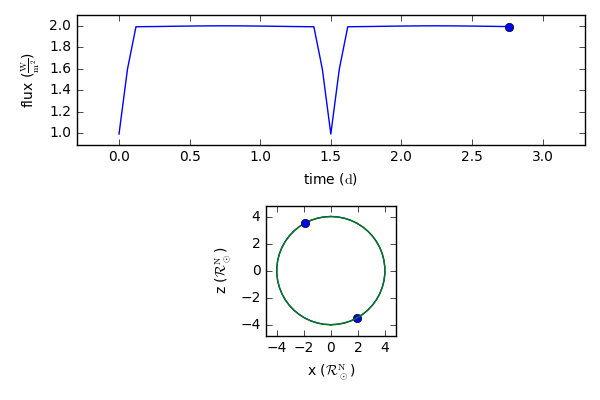
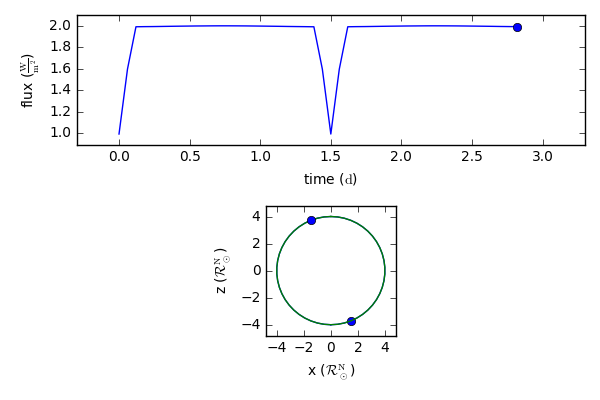
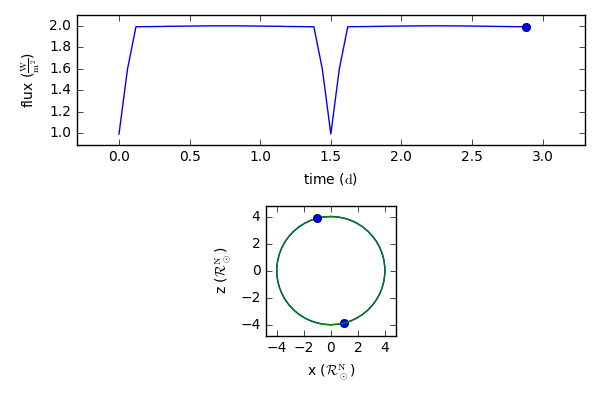
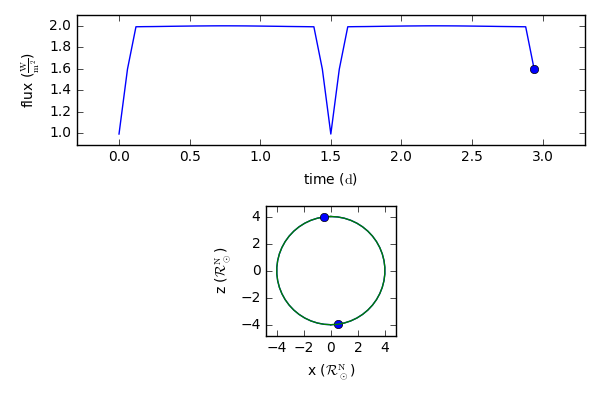
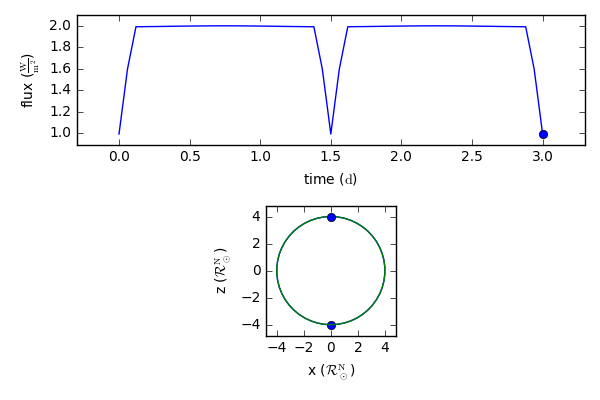

In [15]:
plt.clf()  # this is necessary since the current axes still has the last frame of the previous animation
b.animate({'twig': 'lc01', 'uncover': True}, {'twig': 'orb01'})

To do the same while animating from run_compute, just pass the list of dictionaries to the animate keyword:
- b.run_compute(animate=({'twig': 'lc01', 'uncover': True}, {'twig': 'orb01'}))

The first example above is not directly possible from run_compute, instead you need to pass uncover=True through each dictionary for which you want it applied:
- b.run_compute(animate=({'twig': 'lc01', 'uncover': True}, {'twig': 'orb01', 'uncover': True}))

Disabling Fixed Limits
-------------------------

By default, as can be seen above in the mesh animation, the limits of the axes are automatically set so that they are fixed throughout the animation.

Sometimes this may not be desired.  By setting fixed_limits=False, the axes limits are determined automatically per-frame instead of fixed throughout the animation.

**NOTE:** currently since each frame is drawing to the same axes, the limits will only EXTEND per-frame and will NEVER SHRINK.  This behavior may be changed in the future.

**NOTE:** with fixed limits off, zooming on a subplot will revert immediately on the next frame.

**NOTE:** colorbars are currently not under fixed-limits, meaning that the color-scale is driven by each individual frame separately.  Eventually support will be added so that with fixed_limits=True the color-scale will be fixed across the entire animation as well.

Fixed limits is always False while animating from run_compute, meaning zooming on subplots from run_compute will also always revert.

/usr/local/lib/python2.7/dist-packages/matplotlib/axes/_base.py:2782: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=0.0, right=0.0
  'left=%s, right=%s') % (left, right))
/usr/local/lib/python2.7/dist-packages/matplotlib/axes/_base.py:3040: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=0.994500114605, top=0.994500114605
  'bottom=%s, top=%s') % (bottom, top))



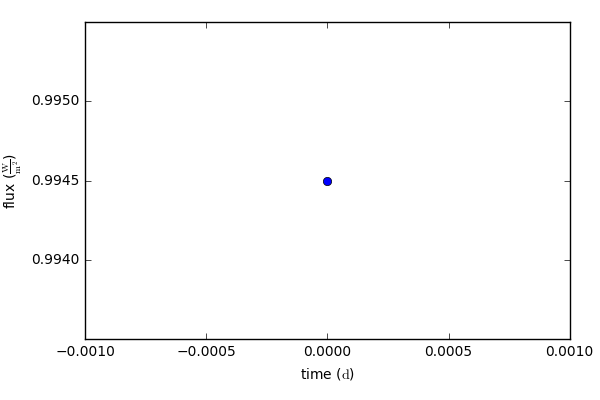
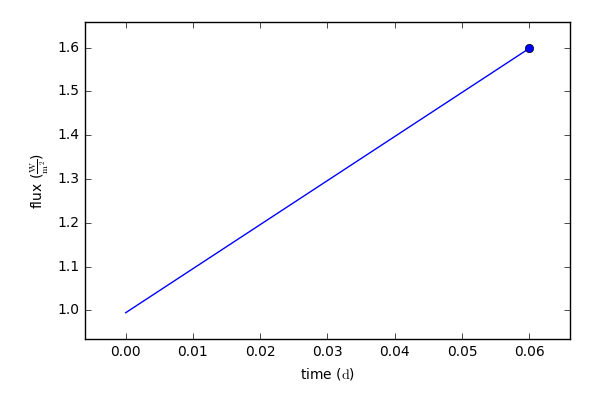
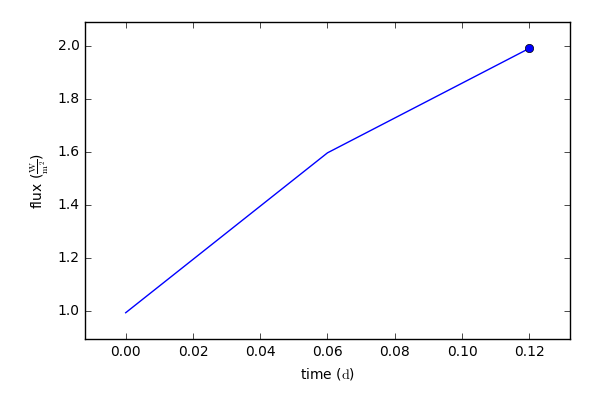
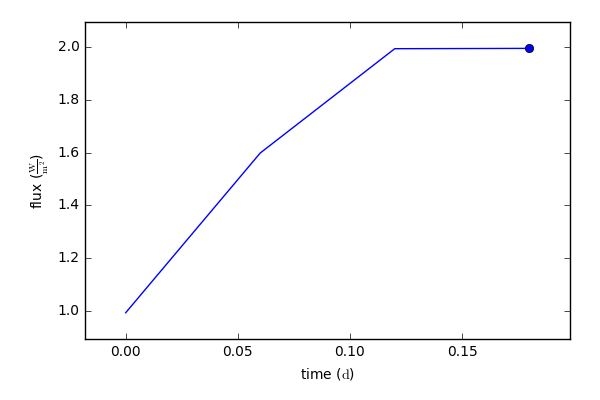
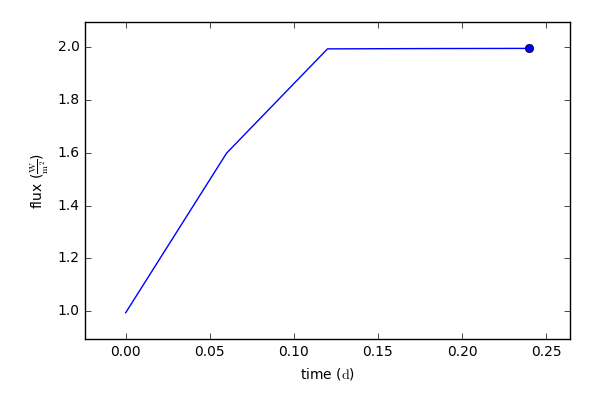
...
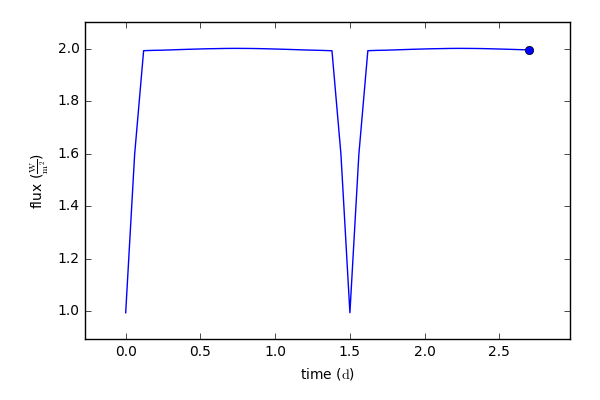
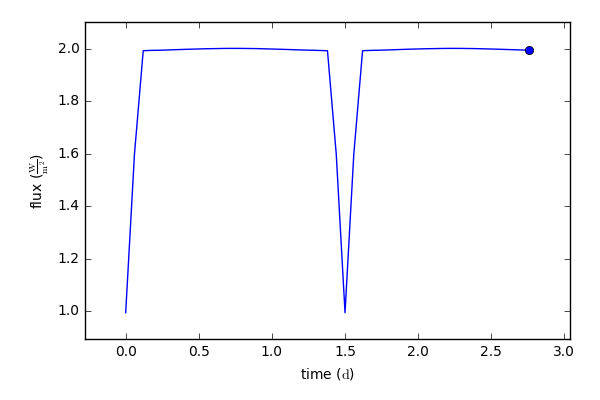
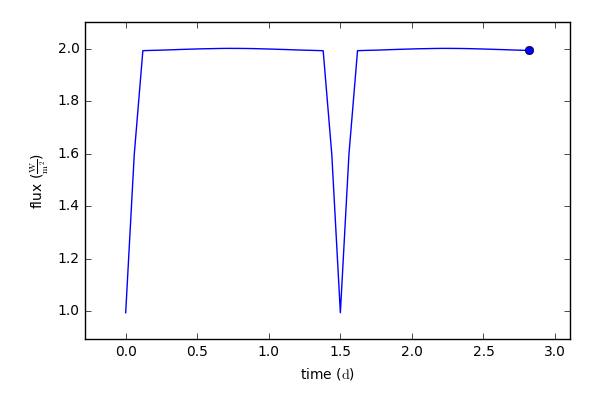
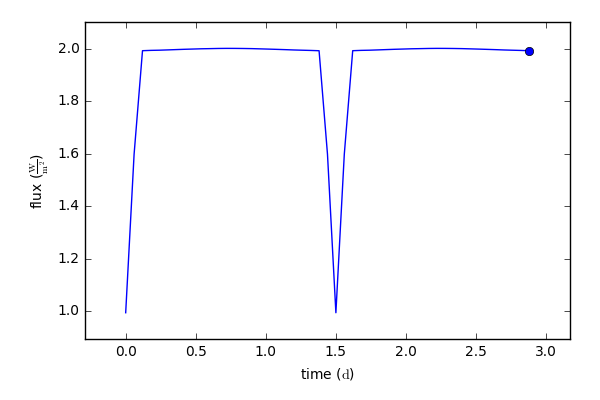
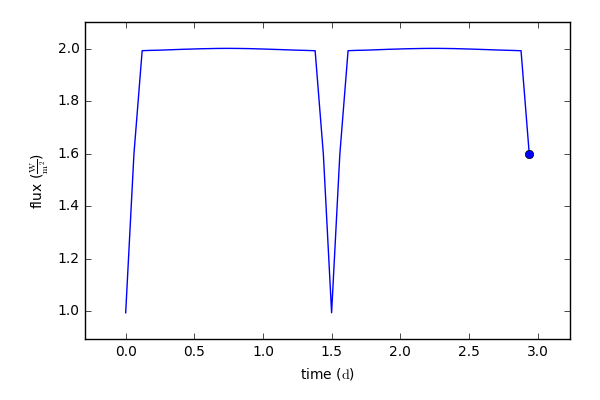

In [16]:
plt.clf()
b['lc01@model'].animate(times=times[:-1], uncover=True, fixed_limits=False)


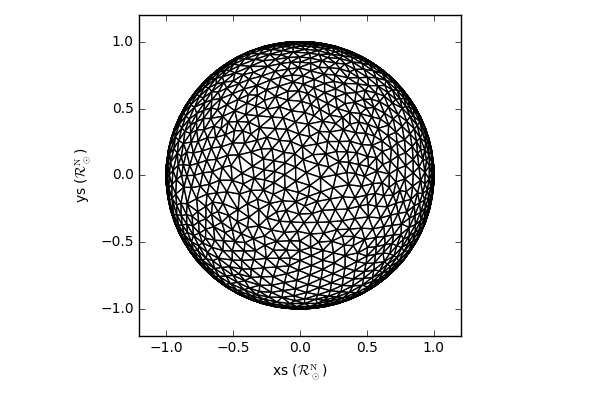
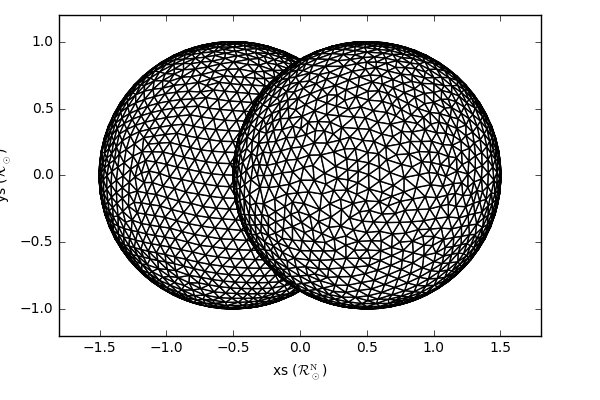
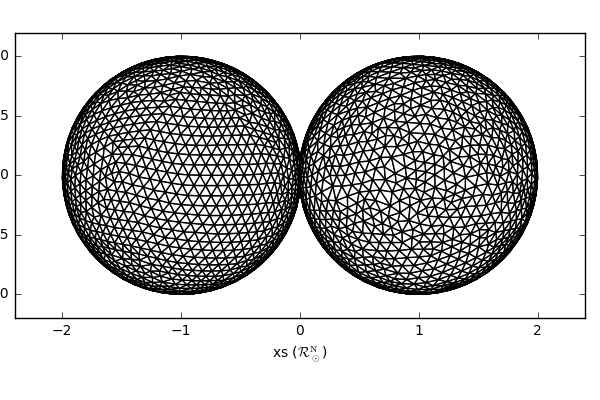
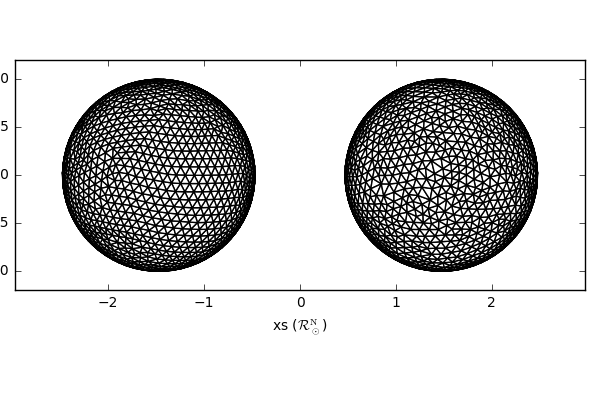
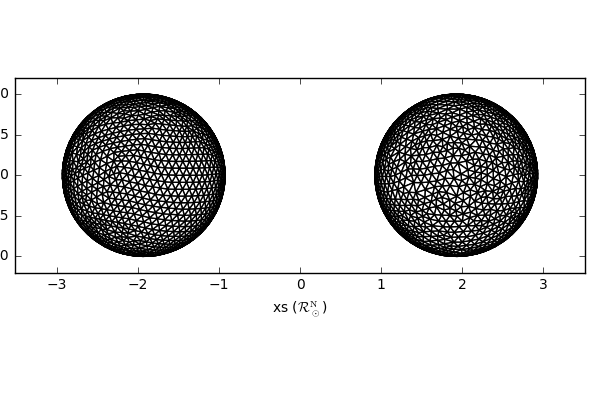
...
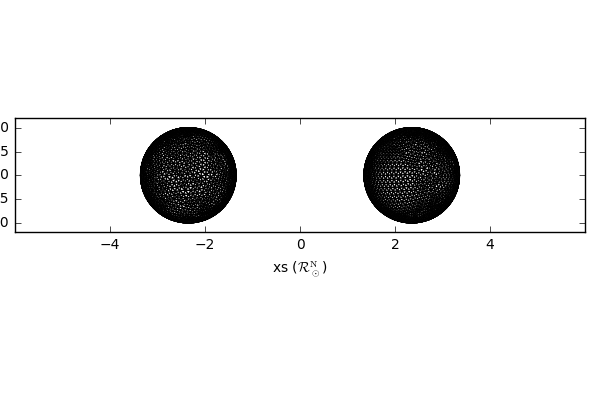
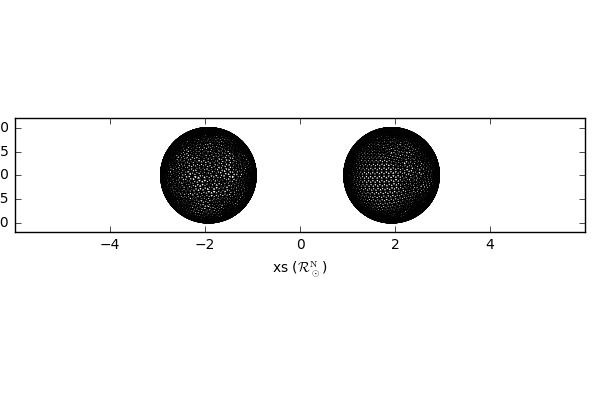
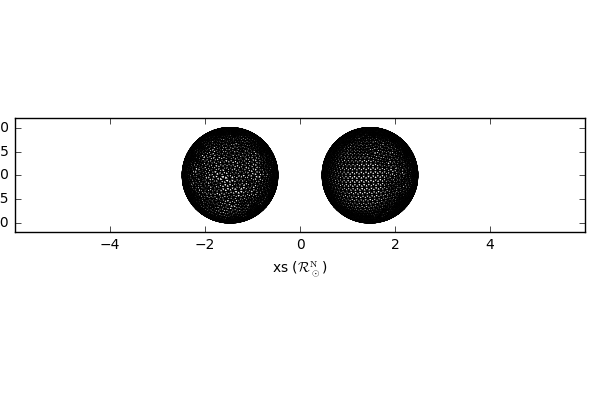
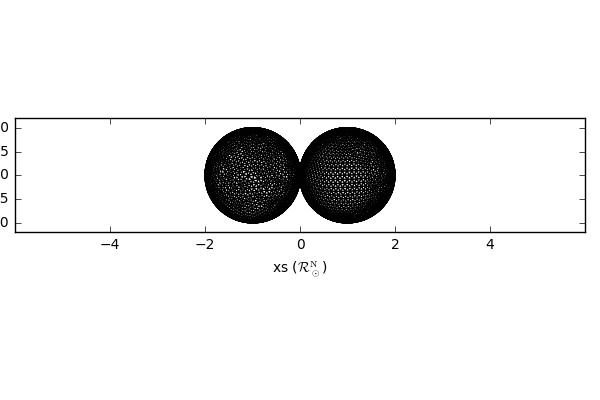
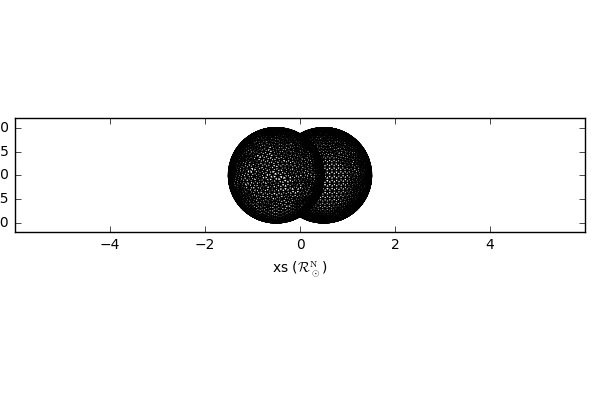

In [17]:
plt.clf()
b['pbmesh@model'].animate(times=times[:-1], fixed_limits=False)

Custom Subplots
----------------------------

We need to setup the axes first, and then pass dictionaries (or a list of dictionaries) to the animate method.  Each dictionary essentially represents a single call to the plot method.

Since the second subplot will contain the meshes, let's set the aspect ratio so that our stars don't appear stretched.  Note that when the subplots are automatically created, the aspect ratio is automatically set to equal for meshes and orbits.

For more information on building custom subplots and how additional arguments are handled, see the [plotting tutorial](plotting)


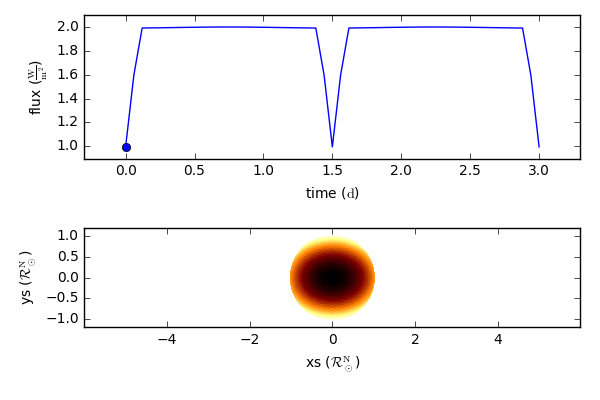
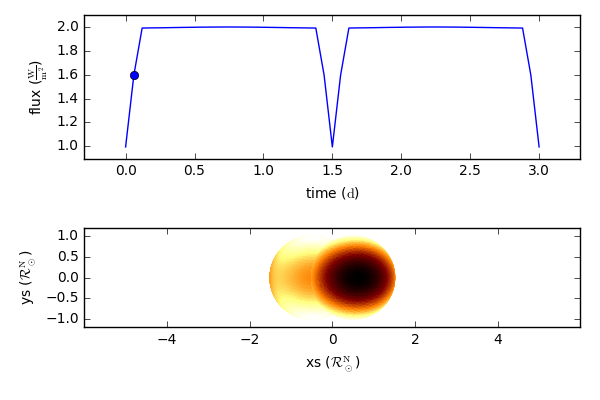
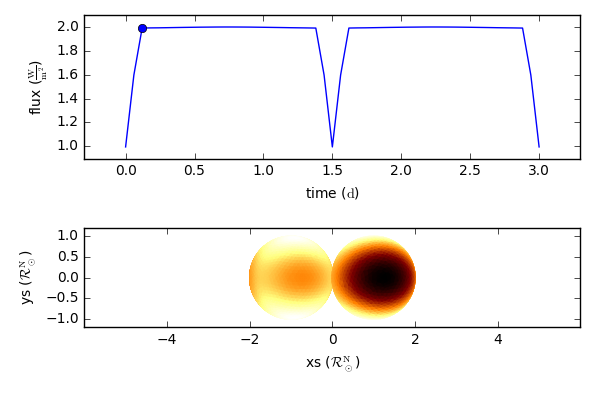
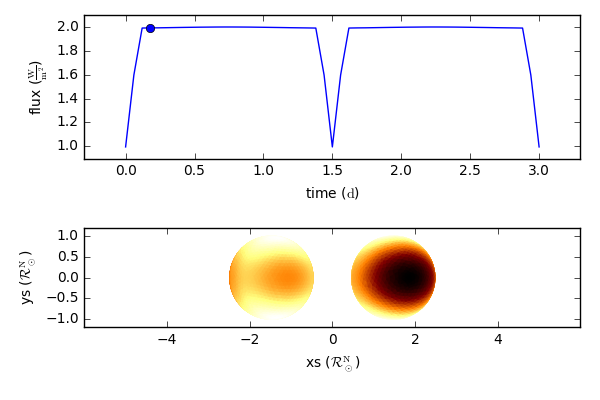
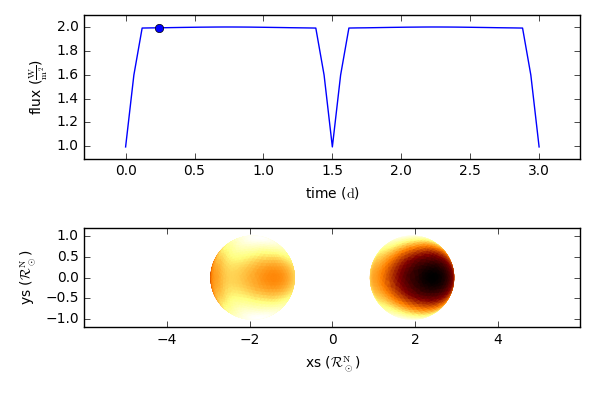
...
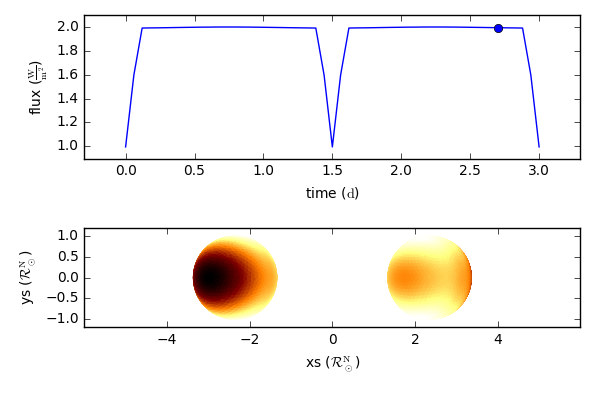
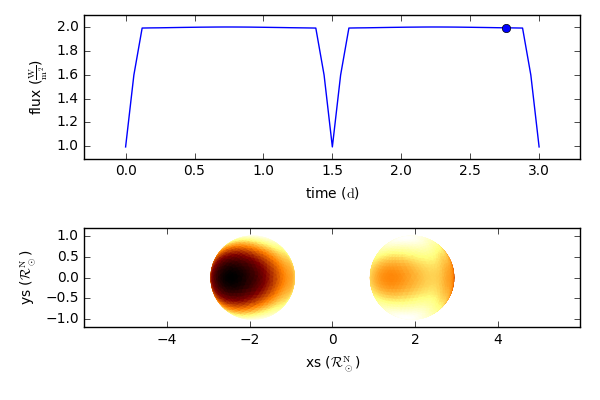
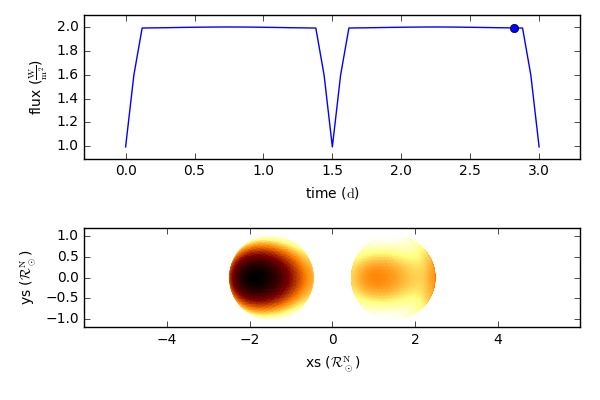
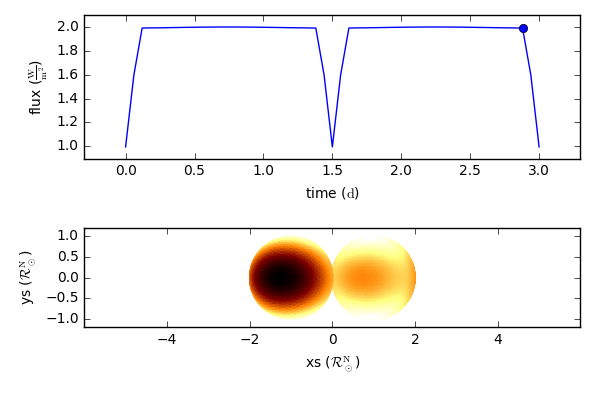
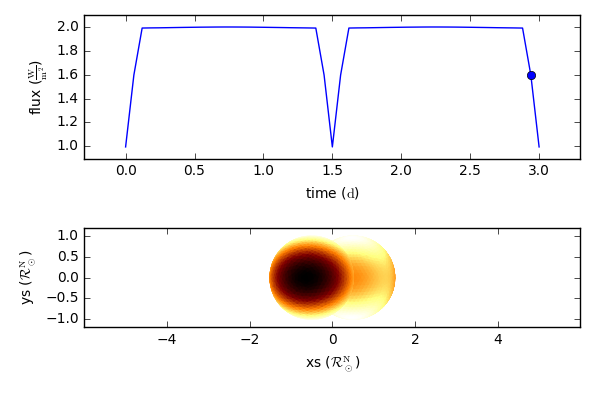

In [18]:
fig = plt.figure()
ax1, ax2 = fig.add_subplot(211), fig.add_subplot(212)
ax2.set_aspect('equal')

plot1 = {'ax': ax1, 'twig': 'lc01@model'}
plot2 = {'ax': ax2, 'twig': 'pbmesh@model', 'facecolor': 'teffs', 'edgecolor': None}

b.animate(plot1, plot2, times=times[:-1])

3D axes
------------

Plotting to 3D axes are supported.  But it is up to the user to define the orientation of the axes (there is no current support for changing the orientation between frames).

NOTE: unfortunately matplotlib's ax.set_aspect('equal') does not work correctly on 3d axes.  For now you'll need to explicity send the axes limits through animate (or plot).

**NOTE: 3D support is currently broken, hopefully it will be back soon**

In [19]:
#fig = plt.figure()
#ax = fig.add_subplot(111, projection='3d')
##ax.set_aspect('equal')  # DOES NOT WORK CORRECTLY FOR 3D AXES

#ax.view_init(30, 30)

#plot1 = {'twig': 'orb01@model'}
#plot2 = {'twig': 'pbmesh@model', 'facecolor': 'teffs', 'edgecolor': None}

#b.animate(plot1, plot2, times=times[:-1], ax=ax, xlim=(-6,6), ylim=(-6,6), zlim=(-6,6))